In [7]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline

In [11]:
# Grafos

import networkx as nx
from networkx.algorithms import bipartite

import community

In [8]:
# Desactivar warnings

import warnings
warnings.filterwarnings('ignore')

In [12]:
# Comprobar las versiones

print("NetworkX ver. {}".format(nx.__version__))
print("Pandas ver. {}".format(pd.__version__))
print("Numpy ver. {}".format(np.__version__))

NetworkX ver. 2.8.4
Pandas ver. 1.5.3
Numpy ver. 1.24.3


# Lectura de ficheros 

In [13]:
df_train = pd.read_csv('fraudTrain.csv')

In [14]:
df_train.head(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [15]:
df_test = pd.read_csv('fraudTest.csv')

In [16]:
df_test.head(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,...,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,...,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,...,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,...,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,...,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


# Obtener un único fichero a partir de train y test

In [17]:
df_total = pd.concat([df_train, df_test])

In [18]:
df_total.head(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [19]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 23 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Unnamed: 0             int64  
 1   trans_date_trans_time  object 
 2   cc_num                 int64  
 3   merchant               object 
 4   category               object 
 5   amt                    float64
 6   first                  object 
 7   last                   object 
 8   gender                 object 
 9   street                 object 
 10  city                   object 
 11  state                  object 
 12  zip                    int64  
 13  lat                    float64
 14  long                   float64
 15  city_pop               int64  
 16  job                    object 
 17  dob                    object 
 18  trans_num              object 
 19  unix_time              int64  
 20  merch_lat              float64
 21  merch_long             float64
 22  is_fraud           

# Selección de atributos para el grafo

In [20]:
df_nodes = df_total[['trans_num', 'trans_date_trans_time', 'cc_num',  'merchant', 'amt', 'first', 
                     'last', 'lat', 'long', 'merch_lat', 'merch_long', 'is_fraud']]

In [21]:
df_nodes.head(5)

,trans_num,trans_date_trans_time,cc_num,merchant,amt,first,last,lat,long,merch_lat,merch_long,is_fraud
0,0b242abb623afc578575680df30655b9,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",4.97,Jennifer,Banks,36.0788,-81.1781,36.011293,-82.048315,0
1,1f76529f8574734946361c461b024d99,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",107.23,Stephanie,Gill,48.8878,-118.2105,49.159047,-118.186462,0
2,a1a22d70485983eac12b5b88dad1cf95,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,220.11,Edward,Sanchez,42.1808,-112.2620,43.150704,-112.154481,0
3,6b849c168bdad6f867558c3793159a81,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",45.00,Jeremy,White,46.2306,-112.1138,47.034331,-112.561071,0
4,a41d7549acf90789359a9aa5346dcb46,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,41.96,Tyler,Garcia,38.4207,-79.4629,38.674999,-78.632459,0


In [22]:
df_nodes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 12 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   trans_num              object 
 1   trans_date_trans_time  object 
 2   cc_num                 int64  
 3   merchant               object 
 4   amt                    float64
 5   first                  object 
 6   last                   object 
 7   lat                    float64
 8   long                   float64
 9   merch_lat              float64
 10  merch_long             float64
 11  is_fraud               int64  
dtypes: float64(5), int64(2), object(5)
memory usage: 183.7+ MB


# Convertir trans_num en string

In [23]:
df_nodes['trans_num'] = df_nodes['trans_num'].astype('string')

In [24]:
df_nodes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 12 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   trans_num              string 
 1   trans_date_trans_time  object 
 2   cc_num                 int64  
 3   merchant               object 
 4   amt                    float64
 5   first                  object 
 6   last                   object 
 7   lat                    float64
 8   long                   float64
 9   merch_lat              float64
 10  merch_long             float64
 11  is_fraud               int64  
dtypes: float64(5), int64(2), object(4), string(1)
memory usage: 183.7+ MB


# Tratamiento de fechas (cambiar tipo de object a datetime)

Convertir en datetime la columna 'trans_date_trans_time', que es object:

In [25]:
df_nodes['trans_date_trans_time'] = pd.to_datetime(df_nodes['trans_date_trans_time'])

In [26]:
df_nodes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 12 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   trans_num              string        
 1   trans_date_trans_time  datetime64[ns]
 2   cc_num                 int64         
 3   merchant               object        
 4   amt                    float64       
 5   first                  object        
 6   last                   object        
 7   lat                    float64       
 8   long                   float64       
 9   merch_lat              float64       
 10  merch_long             float64       
 11  is_fraud               int64         
dtypes: datetime64[ns](1), float64(5), int64(2), object(3), string(1)
memory usage: 183.7+ MB


# Obtener columna buyer (a partir de first y last)

In [27]:
df_nodes['buyer'] = df_nodes['first'].str.cat(df_nodes['last'], sep = ' ')

In [28]:
df_nodes.head(5)

,trans_num,trans_date_trans_time,cc_num,merchant,amt,first,last,lat,long,merch_lat,merch_long,is_fraud,buyer
0,0b242abb623afc578575680df30655b9,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",4.97,Jennifer,Banks,36.0788,-81.1781,36.011293,-82.048315,0,Jennifer Banks
1,1f76529f8574734946361c461b024d99,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",107.23,Stephanie,Gill,48.8878,-118.2105,49.159047,-118.186462,0,Stephanie Gill
2,a1a22d70485983eac12b5b88dad1cf95,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,220.11,Edward,Sanchez,42.1808,-112.2620,43.150704,-112.154481,0,Edward Sanchez
3,6b849c168bdad6f867558c3793159a81,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",45.00,Jeremy,White,46.2306,-112.1138,47.034331,-112.561071,0,Jeremy White
4,a41d7549acf90789359a9aa5346dcb46,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,41.96,Tyler,Garcia,38.4207,-79.4629,38.674999,-78.632459,0,Tyler Garcia


In [29]:
df_nodes = df_nodes.drop(columns=['first', 'last'])

In [30]:
df_nodes.head(5)

,trans_num,trans_date_trans_time,cc_num,merchant,amt,lat,long,merch_lat,merch_long,is_fraud,buyer
0,0b242abb623afc578575680df30655b9,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",4.97,36.0788,-81.1781,36.011293,-82.048315,0,Jennifer Banks
1,1f76529f8574734946361c461b024d99,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",107.23,48.8878,-118.2105,49.159047,-118.186462,0,Stephanie Gill
2,a1a22d70485983eac12b5b88dad1cf95,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,220.11,42.1808,-112.2620,43.150704,-112.154481,0,Edward Sanchez
3,6b849c168bdad6f867558c3793159a81,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",45.00,46.2306,-112.1138,47.034331,-112.561071,0,Jeremy White
4,a41d7549acf90789359a9aa5346dcb46,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,41.96,38.4207,-79.4629,38.674999,-78.632459,0,Tyler Garcia


In [31]:
df_nodes = df_nodes[['trans_num', 'trans_date_trans_time', 'cc_num', 'buyer', 'merchant', 'amt', 'lat', 'long',
                     'merch_lat', 'merch_long', 'is_fraud']]

In [32]:
df_nodes = df_nodes.reset_index()

In [33]:
df_nodes = df_nodes.rename(columns={'index': 'node_id'})

In [34]:
df_nodes.head(5)

,node_id,trans_num,trans_date_trans_time,cc_num,buyer,merchant,amt,lat,long,merch_lat,merch_long,is_fraud
0,0,0b242abb623afc578575680df30655b9,2019-01-01 00:00:18,2703186189652095,Jennifer Banks,"fraud_Rippin, Kub and Mann",4.97,36.0788,-81.1781,36.011293,-82.048315,0
1,1,1f76529f8574734946361c461b024d99,2019-01-01 00:00:44,630423337322,Stephanie Gill,"fraud_Heller, Gutmann and Zieme",107.23,48.8878,-118.2105,49.159047,-118.186462,0
2,2,a1a22d70485983eac12b5b88dad1cf95,2019-01-01 00:00:51,38859492057661,Edward Sanchez,fraud_Lind-Buckridge,220.11,42.1808,-112.2620,43.150704,-112.154481,0
3,3,6b849c168bdad6f867558c3793159a81,2019-01-01 00:01:16,3534093764340240,Jeremy White,"fraud_Kutch, Hermiston and Farrell",45.00,46.2306,-112.1138,47.034331,-112.561071,0
4,4,a41d7549acf90789359a9aa5346dcb46,2019-01-01 00:03:06,375534208663984,Tyler Garcia,fraud_Keeling-Crist,41.96,38.4207,-79.4629,38.674999,-78.632459,0


In [35]:
df_nodes.shape

(1852394, 12)

# Ver si la variable objetivo está balanceada

In [36]:
df_nodes['is_fraud'].value_counts()

0    1842743
1       9651
Name: is_fraud, dtype: int64

In [37]:
df_nodes['is_fraud'].value_counts(normalize=True)

0    0.99479
1    0.00521
Name: is_fraud, dtype: float64

Como ya sabíamos está muy desbalanceada.

# Crear grafo bipartito uniendo compradores y vendedores según las tarjetas utilizadas en las transacciones entre ellos 

Vamos a comprobar si hay clientes que utilizan diferentes tarjetas con un mismo comerciante.  

Primero obtenemos un dataframe con una fila por cada cliente-comerciante-tarjeta.

In [41]:
df_prueba = df_nodes.groupby(['buyer', 'merchant', 'cc_num']).size().reset_index(name='count')

In [42]:
df_prueba_filtrado = df_prueba[df_prueba['count'] > 1]

In [43]:
df_prueba_filtrado

,buyer,merchant,cc_num,count
0,Aaron Murray,fraud_Abbott-Rogahn,376028110684021,4
2,Aaron Murray,fraud_Abernathy and Sons,376028110684021,6
3,Aaron Murray,fraud_Abshire PLC,376028110684021,4
4,Aaron Murray,"fraud_Adams, Kovacek and Kuhlman",376028110684021,2
5,Aaron Murray,"fraud_Altenwerth, Cartwright and Koss",376028110684021,8
...,...,...,...,...
529317,Zachary Boone,fraud_Wolf Inc,374821819075109,6
529318,Zachary Boone,"fraud_Wuckert, Wintheiser and Friesen",374821819075109,2
529322,Zachary Boone,fraud_Zboncak LLC,374821819075109,2
529323,Zachary Boone,fraud_Zboncak Ltd,374821819075109,2


Agrupamos ahora por cliente-comerciante y contamos si hay pares repetidos.

In [44]:
df_prueba_2 = df_prueba_filtrado.groupby(['buyer', 'merchant']).size().reset_index(name='count_2')

In [45]:
df_prueba_filtrado_2 = df_prueba_2[df_prueba_2['count_2'] > 1]

In [46]:
df_prueba_filtrado_2

,buyer,merchant,count_2
164153,Jeffrey Smith,fraud_Abbott-Rogahn,2
164154,Jeffrey Smith,fraud_Abbott-Steuber,2
164156,Jeffrey Smith,fraud_Abshire PLC,2
164157,Jeffrey Smith,"fraud_Adams, Kovacek and Kuhlman",2
164158,Jeffrey Smith,fraud_Adams-Barrows,2
...,...,...,...
346839,Scott Martin,"fraud_Zboncak, Rowe and Murazik",2
346840,Scott Martin,fraud_Zemlak Group,2
346842,Scott Martin,fraud_Ziemann-Waters,2
346843,Scott Martin,"fraud_Zieme, Bode and Dooley",2


Efectivamente, hay clientes con varias tarjetas, que utilizan con un mismo comerciante. Elegiremos, por tanto, como nodo origen de cada transacción la tarjeta en vez del cliente, pues en cada transacción sólo se utiliza una y queremos evitar crear un multigrafo.  

In [47]:
# Crear un grafo vacío no dirigido

G = nx.Graph()
G.clear()

In [48]:
# Creamos la lista de identificadores de los nodos enumerando la lista de tarjetas + vendedores 

node_ids = {x:node_id for node_id,x in enumerate(set(df_nodes['cc_num'].values.tolist() + df_nodes['merchant'].values.tolist()))}

In [49]:
# Asignamos sus identificadores a las tarjetas 

df_nodes['card_id'] = df_nodes['cc_num'].apply(lambda x: node_ids[x])

In [50]:
# Asignamos sus identificadores a los vendedores 

df_nodes['merchant_id'] = df_nodes['merchant'].apply(lambda x: node_ids[x])

In [51]:
# Creamos el dataframe con las aristas.
# Se sumarán el número de fraudes y el importe total por tarjeta

df_edgelist = df_nodes[['card_id', 'cc_num',  'buyer', 'merchant_id', 'merchant', 'amt', 'is_fraud']]\
  .groupby(['card_id', 'cc_num',  'buyer', 'merchant_id', 'merchant'])\
  .agg({'is_fraud': 'sum', 'amt': 'sum'}).reset_index()

In [52]:
df_edgelist.head(5)

,card_id,cc_num,buyer,merchant_id,merchant,is_fraud,amt
0,1,3524574586339330,Ashley Cabrera,0,fraud_Reichert-Weissnat,0,9.04
1,1,3524574586339330,Ashley Cabrera,2,fraud_Barton LLC,0,248.18
2,1,3524574586339330,Ashley Cabrera,5,"fraud_Denesik, Powlowski and Pouros",0,44.26
3,1,3524574586339330,Ashley Cabrera,8,"fraud_Schroeder, Wolff and Hermiston",0,31.59
4,1,3524574586339330,Ashley Cabrera,12,"fraud_Lubowitz, Terry and Stracke",0,148.14


In [53]:
# Como 'is_fraud' es la variable objetivo: 
# - Tendrá valor 1 cuando la suma anterior haya sido > 0
# - tendrá valor 0 cuando la suma anterior haya sido = 0 

df_edgelist['is_fraud'] = df_edgelist['is_fraud'].apply(lambda x: 1 if x>0 else 0)

In [54]:
# Creamos los nodos de las tarjetas

G.add_nodes_from(df_nodes['card_id'], bipartite=0)

In [55]:
# Creamos los nodos de los vendedores

G.add_nodes_from(df_nodes['merchant_id'], bipartite=1)

In [56]:
# Añadimos las aristas entre tarjetas y vendedores 

G.add_edges_from(df_edgelist[['card_id', 'merchant_id']].values)

In [57]:
# Cargamos el número de tarjeta en cada nodo de tarjeta

nx.set_node_attributes(G, {row['card_id']:row['cc_num'] for idx, row in df_edgelist.iterrows()}, 'cc_num')

In [58]:
# Cargamos el nombre del comprador en cada nodo de tarjeta

nx.set_node_attributes(G, {row['card_id']:row['buyer'] for idx, row in df_edgelist.iterrows()}, 'buyer')

In [59]:
# Cargamos el nombre del vendedor en cada nodo de vendedor

nx.set_node_attributes(G, {row['merchant_id']:row['merchant'] for idx, row in df_edgelist.iterrows()}, 'merchant')

In [60]:
# Cargamos la variable objetivo en cada arista entre tarjeta y vendedor 

nx.set_edge_attributes(G, {(x['card_id'], x['merchant_id']):x['is_fraud'] for idx,x in df_edgelist[['card_id', 'merchant_id', 'is_fraud']].iterrows()}, 'is_fraud')   

In [61]:
# Cargamos el importe total de las transacciones en cada arista entre tarjeta y vendedor. Será el peso de la arista 

nx.set_edge_attributes(G, {(x['card_id'], x['merchant_id']):x['amt'] for idx,x in df_edgelist[['card_id', 'merchant_id', 'amt']].iterrows()}, 'weight')   

# Validación de la estructura del grafo

In [62]:
# Comprobamos que el grafo obtenido es bipartito

nx.is_bipartite(G)

True

# Topología de la red - Análisis estadístico

## Grados

In [63]:
print(G)

Graph with 1692 nodes and 529328 edges


In [64]:
# Creamos una lista con los grados de todos los nodos del grafo

degrees = [d for _, d in G.degree()]

In [65]:
# Mostramos estadísticos sobre los grados

print('El grado máximo es: {}'.format(max(degrees)))
print('El grado mínimo es: {}'.format(min(degrees)))
print('La media de los grados del grafo es: {:.4f}'.format(np.mean(degrees)))
print('La mediana de los grados del grafo es: {}'.format(np.median(degrees)))

El grado máximo es: 889
El grado mínimo es: 5
La media de los grados del grafo es: 625.6832
La mediana de los grados del grafo es: 649.0


Vamos a generar una gráfica que nos muestre la distribución de grados del grafo.

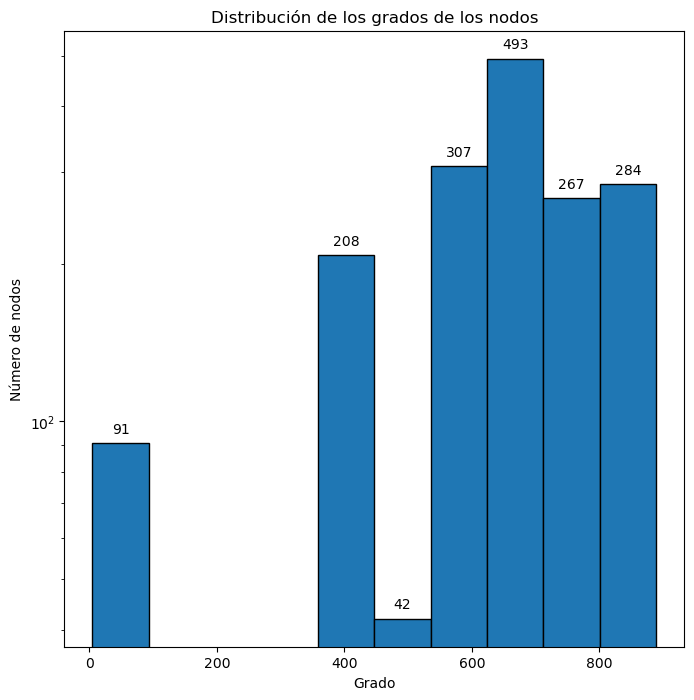

In [66]:
# Generamos una gráfica con la distribución de grados

plt.figure(figsize=(8,8))

degrees = pd.Series({k: v for k, v in nx.degree(G)})
hist = degrees.plot.hist(edgecolor='black')

plt.xlabel('Grado')
plt.ylabel('Número de nodos')
plt.title('Distribución de los grados de los nodos')
plt.yscale("log")

# Añadimos etiquetas en las barras
for rect in hist.patches:
    # Obtener las coordenadas x e y del rectángulo
    x = rect.get_x() + rect.get_width() / 2
    y = rect.get_height()

    # Formatear el texto que se mostrará (en este caso, el valor del bin)
    label = f'{int(y)}'

    # Añadir el texto en la posición adecuada
    hist.annotate(label, (x, y), xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')
    
plt.show();    

## Distribución de los pesos de las aristas

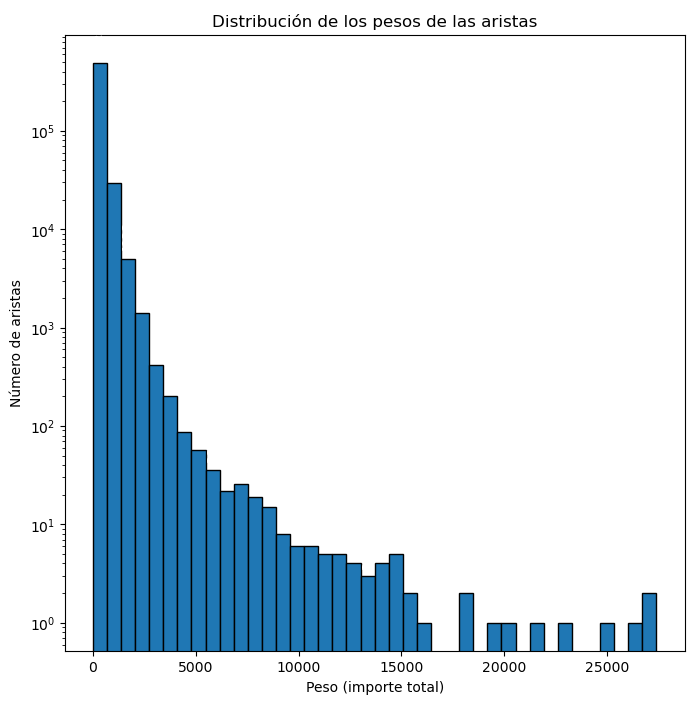

In [67]:
# Creamos una gráfica con la distribución de los pesos

# Creamos una pandas serie con los pesos de las aristas
pesos = pd.Series({(d[0], d[1]): d[2]['weight'] for d in G.edges(data=True)})

# Obtención de distintos percentiles de los pesos de las aristas 
quant_dist = np.quantile(pesos.values, [0.10, 0.50, 0.70, 0.9, 1.0])

# Eliminamos los pesos del percentil 100% para quitar valores extremos y visualizar mejor la distribución 
pesosFiltered = pd.Series({(d[0], d[1]): d[2]["weight"] for d in G.edges(data=True) 
                                     if d[2]["weight"] < quant_dist[-1]})

plt.figure(figsize=(8,8))

hist = pesosFiltered.plot.hist(bins=40, edgecolor='black')

plt.xlabel('Peso (importe total)')
plt.ylabel('Número de aristas')
plt.title('Distribución de los pesos de las aristas')
plt.yscale("log")

# Añadimos etiquetas en las barras
for rect in hist.patches:
    # Obtener las coordenadas x e y del rectángulo
    x = rect.get_x() + rect.get_width() / 2
    y = rect.get_height()

    # Formatear el texto que se mostrará (en este caso, el valor del bin)
    label = f'{int(y)}'

    # Añadir el texto en la posición adecuada
    hist.annotate(label, (x, y), xytext=(0, 5), textcoords='offset points', ha='center', va='bottom', rotation=90,
                  color='white', weight='bold', fontsize=8)
    
plt.show();    

## Centralidad de grado

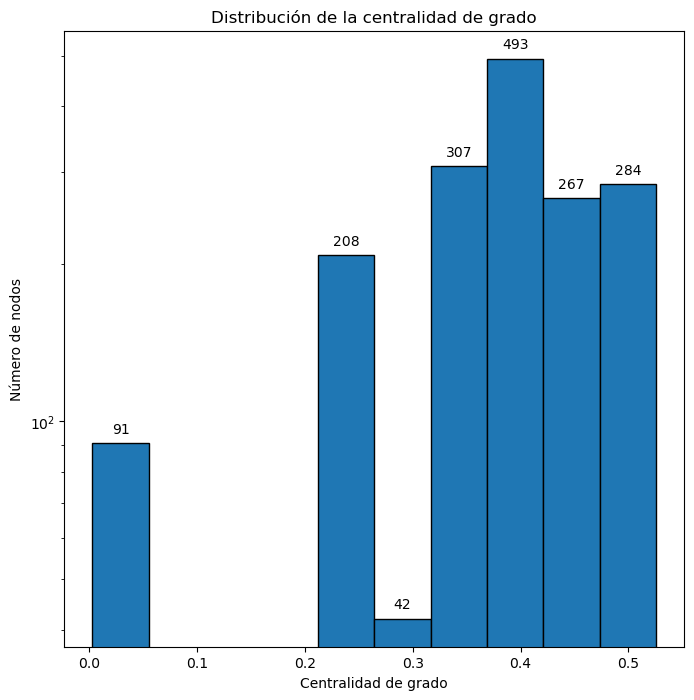

In [68]:
# Creamos una gráfica con la distribución de la centralidad de grado

plt.figure(figsize=(8,8))

bc = nx.degree_centrality(G)

bc_distr = pd.Series(bc)
hist = bc_distr.plot.hist(edgecolor='black')

plt.xlabel('Centralidad de grado')
plt.ylabel('Número de nodos')
plt.title('Distribución de la centralidad de grado')
plt.yscale("log")

# Añadimos etiquetas en las barras
for rect in hist.patches:
    # Obtener las coordenadas x e y del rectángulo
    x = rect.get_x() + rect.get_width() / 2
    y = rect.get_height()

    # Formatear el texto que se mostrará (en este caso, el valor del bin)
    label = f'{int(y)}'

    # Añadir el texto en la posición adecuada
    hist.annotate(label, (x, y), xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')
    
plt.show();  

## Centralidad de intermediación

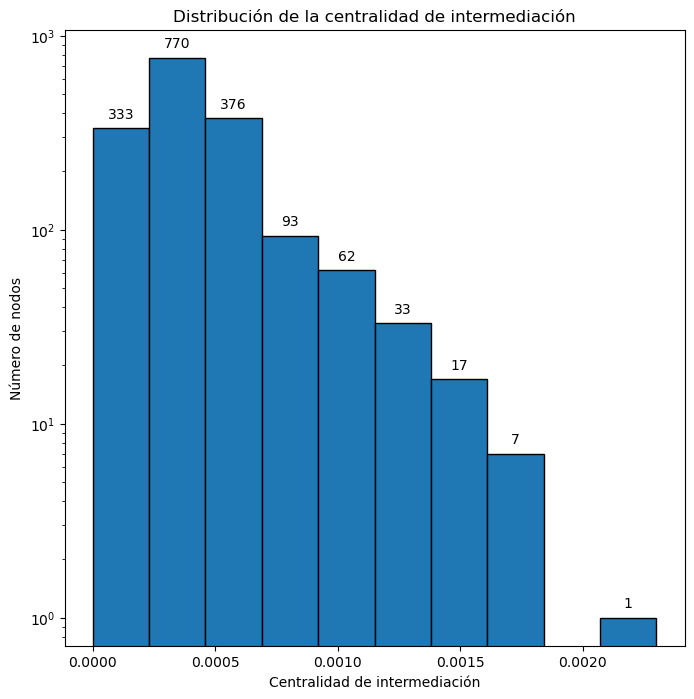

In [69]:
# Creamos una gráfica con la distribución dela centralidad de intermediación

plt.figure(figsize=(8,8))

bc = nx.betweenness_centrality(G)

bc_distr = pd.Series(bc)
hist = bc_distr.plot.hist(edgecolor='black')

plt.xlabel('Centralidad de intermediación')
plt.ylabel('Número de nodos')
plt.title('Distribución de la centralidad de intermediación')
plt.yscale("log")

# Añadimos etiquetas en las barras
for rect in hist.patches:
    # Obtener las coordenadas x e y del rectángulo
    x = rect.get_x() + rect.get_width() / 2
    y = rect.get_height()

    # Formatear el texto que se mostrará (en este caso, el valor del bin)
    label = f'{int(y)}'

    # Añadir el texto en la posición adecuada
    hist.annotate(label, (x, y), xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')
    
plt.show();  

## Centralidad de cercanía

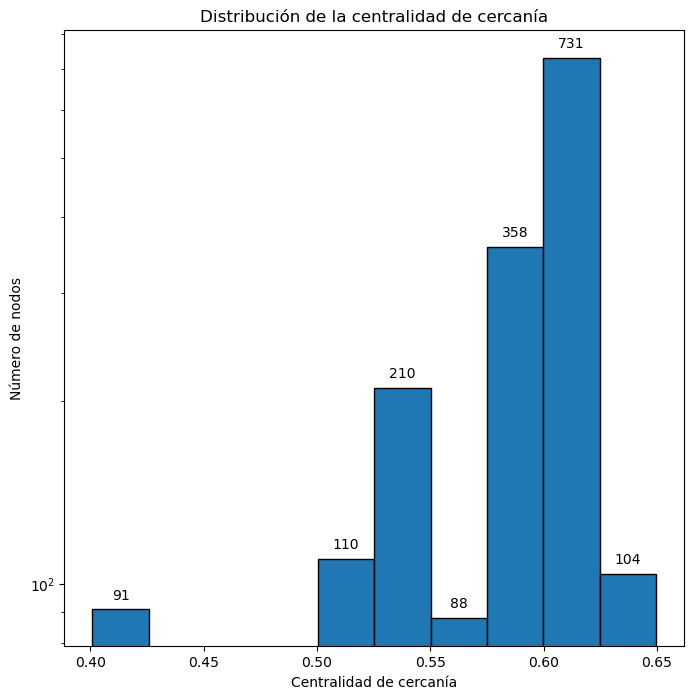

In [70]:
# Creamos una gráfica con la distribución de la centralidad de grado

plt.figure(figsize=(8,8))

bc = nx.closeness_centrality(G)

bc_distr = pd.Series(bc)
hist = bc_distr.plot.hist(edgecolor='black')

plt.xlabel('Centralidad de cercanía')
plt.ylabel('Número de nodos')
plt.title('Distribución de la centralidad de cercanía')
plt.yscale("log")

# Añadimos etiquetas en las barras
for rect in hist.patches:
    # Obtener las coordenadas x e y del rectángulo
    x = rect.get_x() + rect.get_width() / 2
    y = rect.get_height()

    # Formatear el texto que se mostrará (en este caso, el valor del bin)
    label = f'{int(y)}'

    # Añadir el texto en la posición adecuada
    hist.annotate(label, (x, y), xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')
    
plt.show();

## Centralidad del vector propio

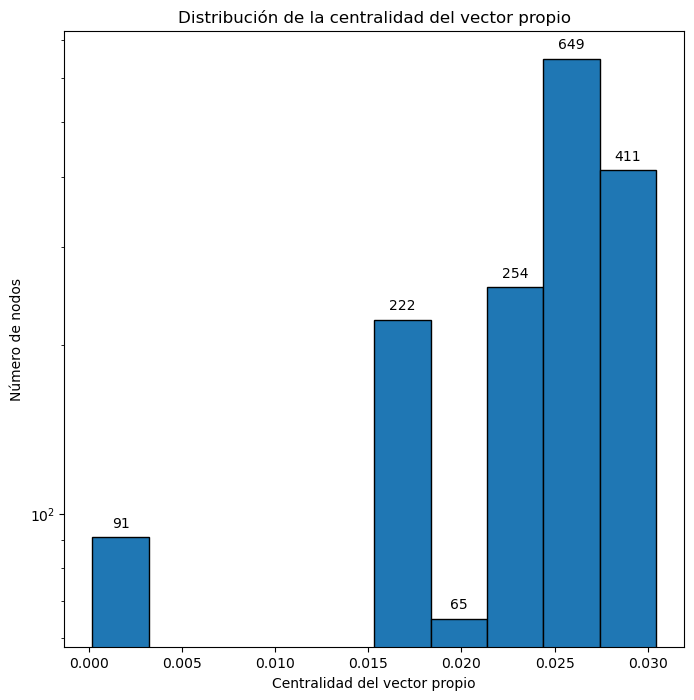

In [71]:
# Creamos una gráfica con la distribución de la centralidad del vector propio

plt.figure(figsize=(8,8))

bc = nx.eigenvector_centrality(G, max_iter=15000)

bc_distr = pd.Series(bc)
hist = bc_distr.plot.hist(edgecolor='black')

plt.xlabel('Centralidad del vector propio')
plt.ylabel('Número de nodos')
plt.title('Distribución de la centralidad del vector propio')
plt.yscale("log")

# Añadimos etiquetas en las barras
for rect in hist.patches:
    # Obtener las coordenadas x e y del rectángulo
    x = rect.get_x() + rect.get_width() / 2
    y = rect.get_height()

    # Formatear el texto que se mostrará (en este caso, el valor del bin)
    label = f'{int(y)}'

    # Añadir el texto en la posición adecuada
    hist.annotate(label, (x, y), xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')
    
plt.show();

## Asortatividad

In [72]:
nx.degree_pearson_correlation_coefficient(G)

-0.5614493021980977

# Detección de comunidades y análisis del ratio de transacciones fraudulentas

## Lista de comunidades del grafo

Se obtiene la lista de comunidades del grafo mediante el **algoritmo de Louvain.**

In [73]:
partitions = community.best_partition(G, random_state=42, weight='weight')

In [74]:
communities = pd.Series(partitions)
communities.value_counts().sort_values(ascending=False)

1    675
0    402
2    307
5    274
4     28
3      6
dtype: int64

## Ratio de transacciones  fraudulentas en las comunidades 

In [75]:
graphs = []
d = {}
for x in communities.unique():
    # Se obtiene el subgrafo de cada comunidad
    tmp = nx.subgraph(G, communities[communities==x].index)

    # Se suma el número de aristas fraudulentas de cada subgrafo
    fraud_edges = sum(nx.get_edge_attributes(tmp, 'is_fraud').values())

    # Se calcula el ratio de aristas fraudulentas con respecto al total de aristas del subgrafo
        ratio = 0 if fraud_edges == 0 else (fraud_edges/tmp.number_of_edges())*100

    d[x] = ratio
    graphs += [tmp]
    
pd.Series(d).sort_values(ascending=False)    

3    80.000000
4    30.882353
0     3.765657
5     1.552558
1     1.203280
2     0.994606
dtype: float64

## Visualización de las comunidades del grafo 

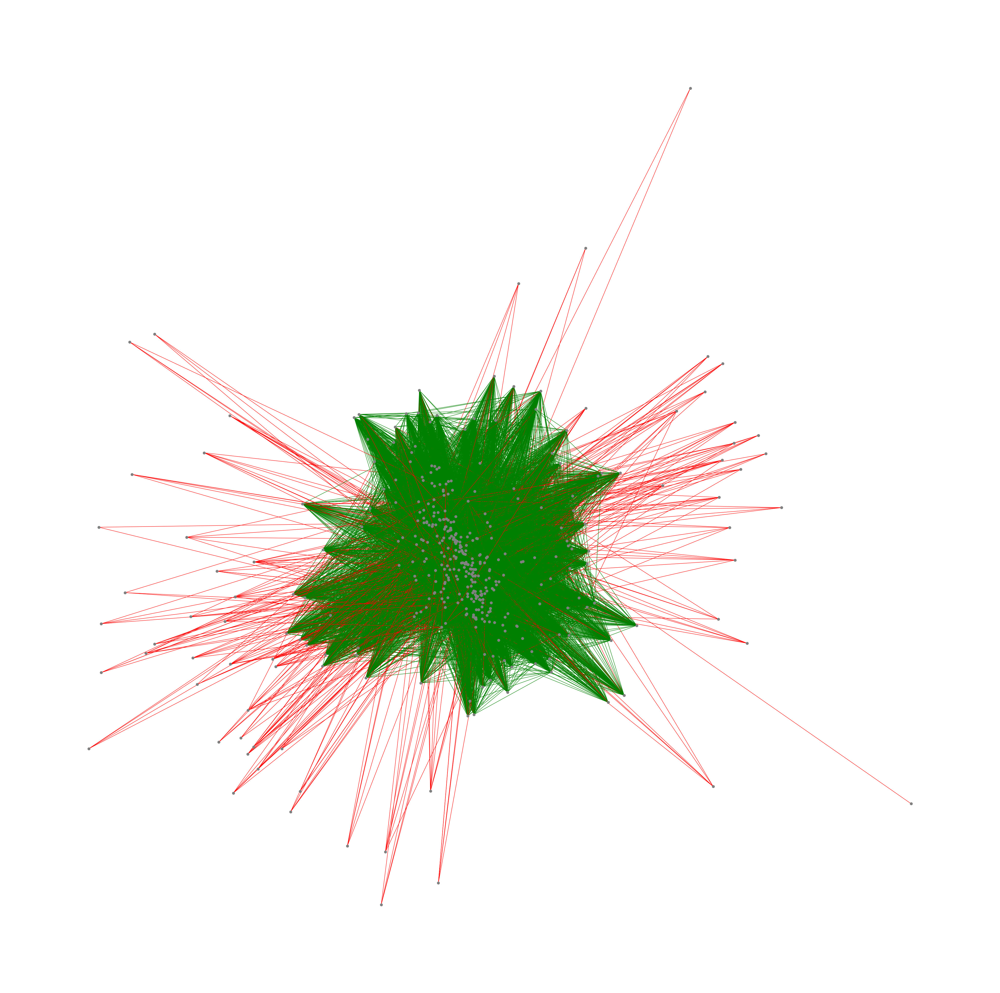

In [79]:
# Comunidad 1

# Posición de la comunidad en la lista de comunidades
gId = 0

plt.figure(figsize=(50,50))
pos = nx.spring_layout(graphs[gId])
plt.axis("off")
edge_colors = ["r" if x == 1 else "g" for x in nx.get_edge_attributes(graphs[gId], 'is_fraud').values()]
nx.draw_networkx(graphs[gId], # Comunidad 1pos=pos, 
                 node_color='grey',
                 edge_color=edge_colors, with_labels=False, node_size=50)

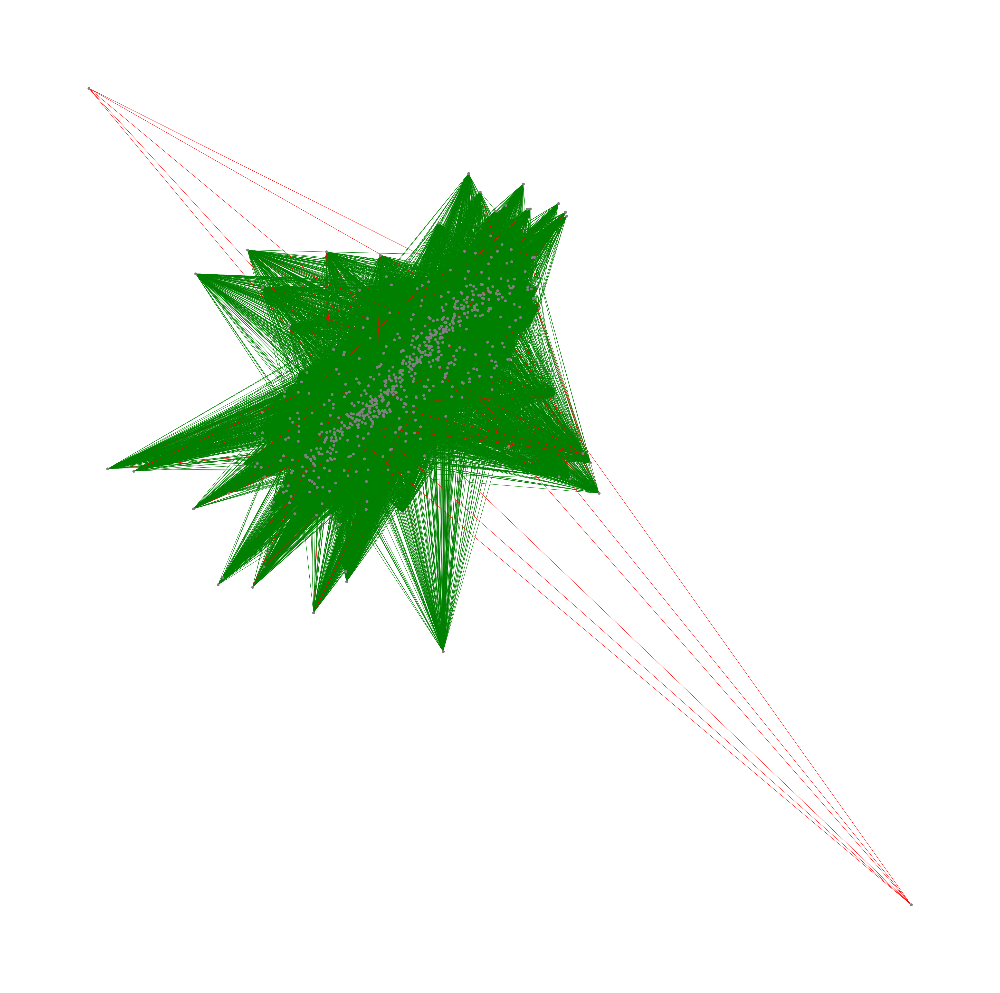

In [80]:
# Comunidad 0

# Posición de la comunidad en la lista de comunidades
gId = 1

plt.figure(figsize=(50,50))
pos = nx.spring_layout(graphs[gId])
plt.axis("off")
edge_colors = ["r" if x == 1 else "g" for x in nx.get_edge_attributes(graphs[gId], 'is_fraud').values()]
nx.draw_networkx(graphs[gId], pos=pos, 
                 node_color='grey',
                 edge_color=edge_colors, with_labels=False, node_size=50)

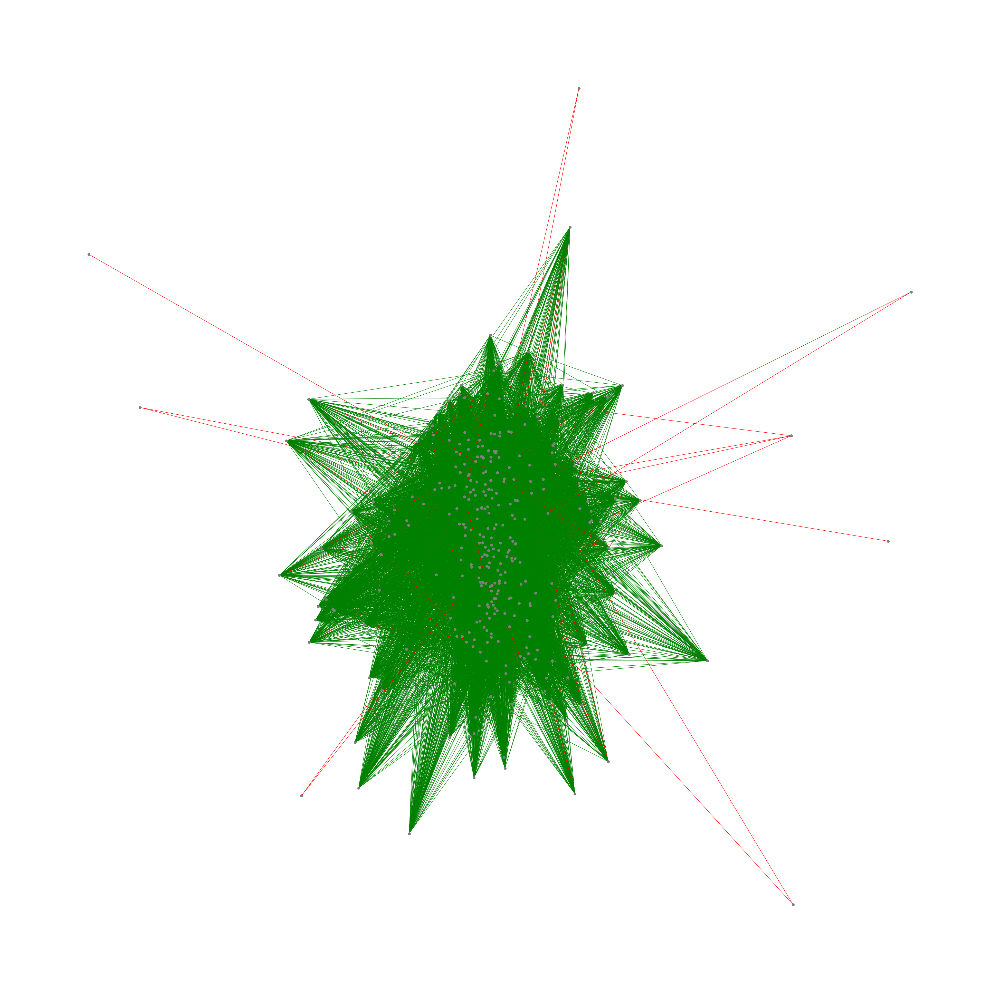

In [81]:
# Comunidad 2

# Posición de la comunidad en la lista de comunidades
gId = 2

plt.figure(figsize=(50,50))
pos = nx.spring_layout(graphs[gId])
plt.axis("off")
edge_colors = ["r" if x == 1 else "g" for x in nx.get_edge_attributes(graphs[gId], 'is_fraud').values()]
nx.draw_networkx(graphs[gId], pos=pos, 
                 node_color='grey',
                 edge_color=edge_colors, with_labels=False, node_size=50)

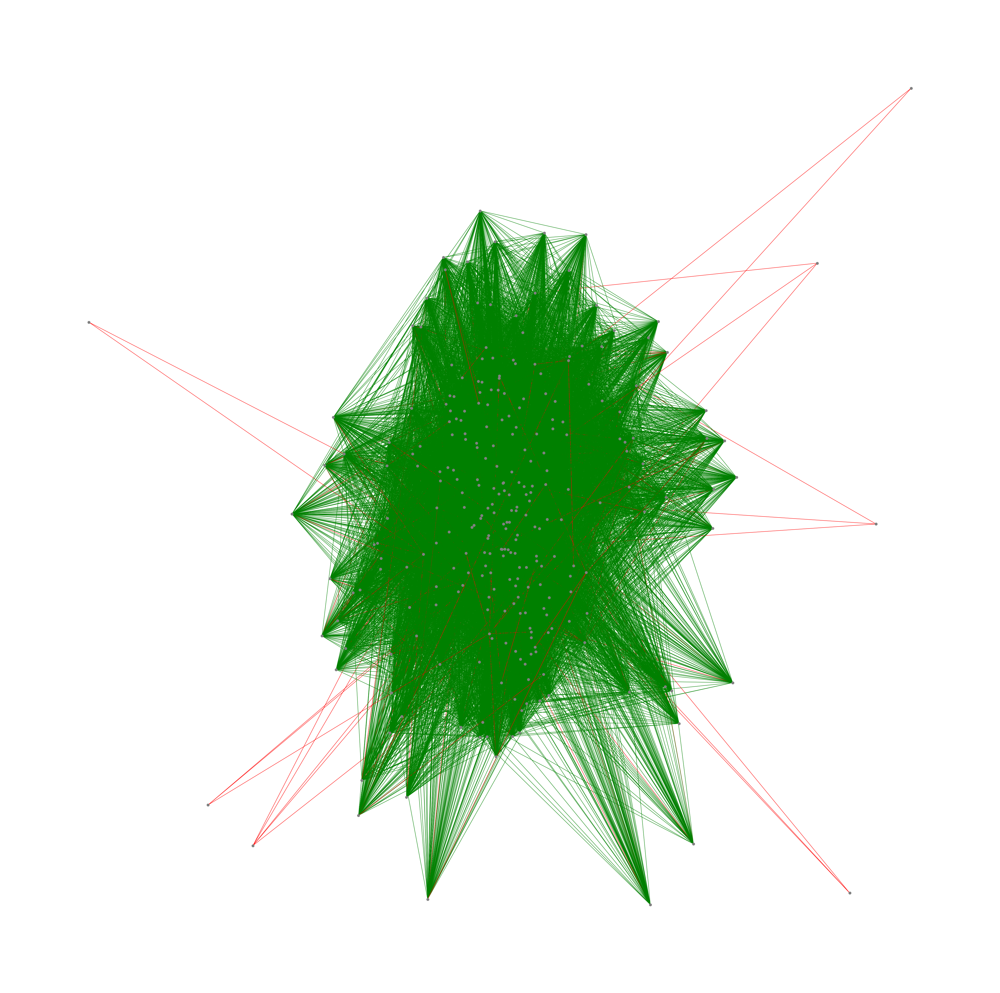

In [82]:
# Comunidad 5

# Posición de la comunidad en la lista de comunidades
gId = 3

plt.figure(figsize=(50,50))
pos = nx.spring_layout(graphs[gId])
plt.axis("off")
edge_colors = ["r" if x == 1 else "g" for x in nx.get_edge_attributes(graphs[gId], 'is_fraud').values()]
nx.draw_networkx(graphs[gId], pos=pos, 
                 node_color='grey',
                 edge_color=edge_colors, with_labels=False, node_size=50)

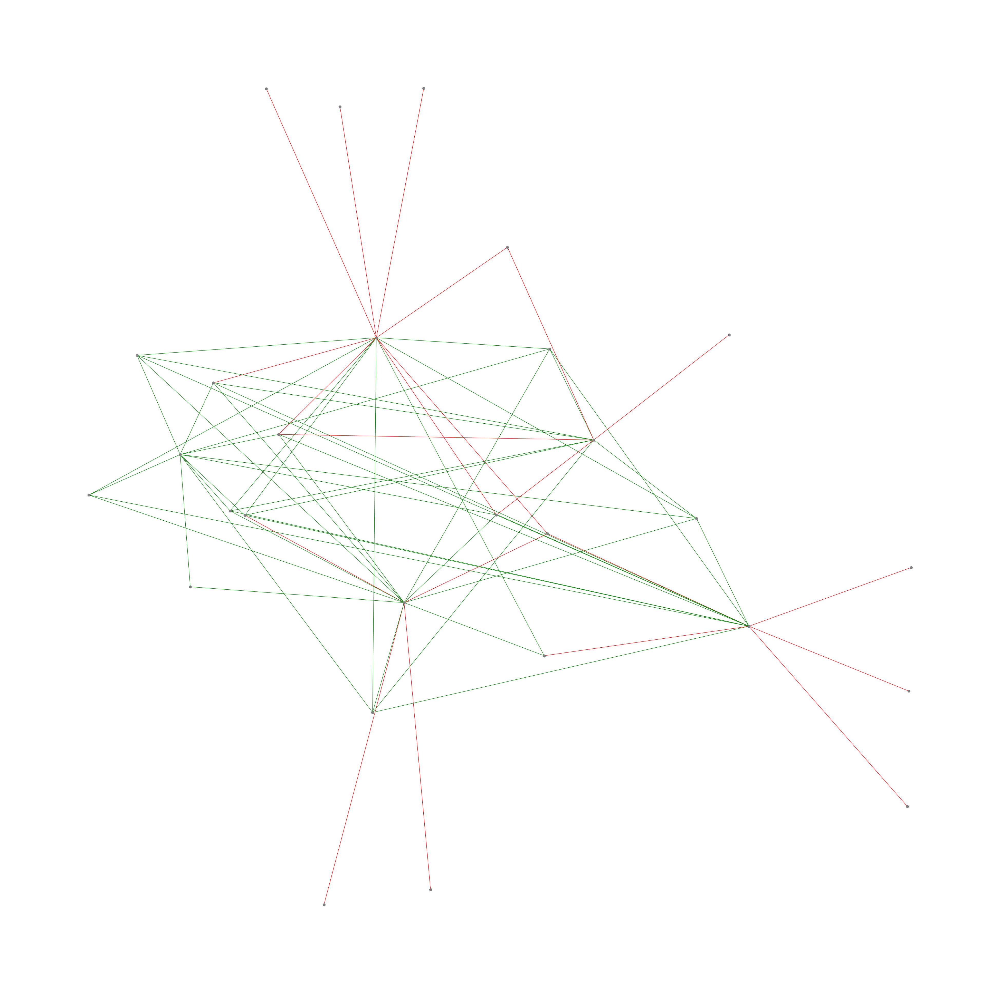

In [83]:
# Comunidad 4

# Posición de la comunidad en la lista de comunidades
gId = 4

plt.figure(figsize=(50,50))
pos = nx.spring_layout(graphs[gId])
plt.axis("off")
edge_colors = ["r" if x == 1 else "g" for x in nx.get_edge_attributes(graphs[gId], 'is_fraud').values()]
nx.draw_networkx(graphs[gId], pos=pos, 
                 node_color='grey',
                 edge_color=edge_colors, with_labels=False, node_size=50)

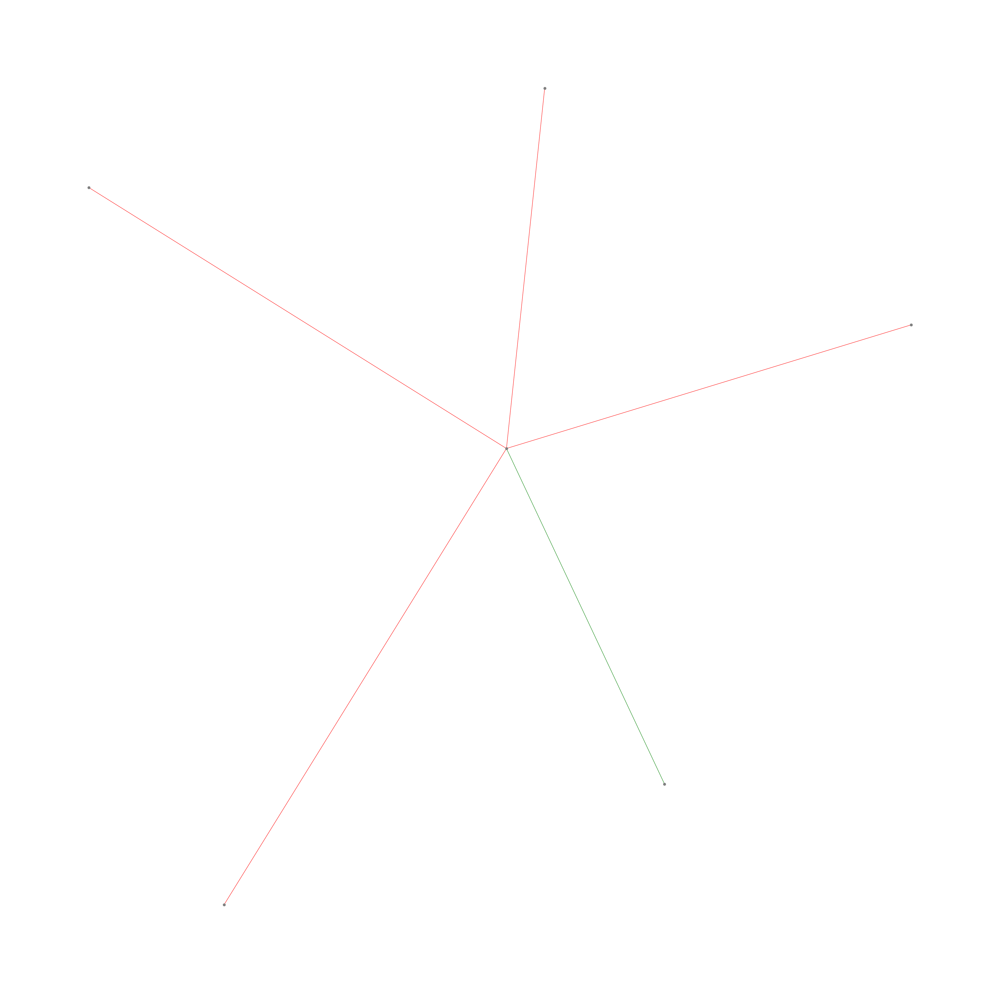

In [84]:
# Comunidad 3

# Posición de la comunidad en la lista de comunidades
gId = 5

plt.figure(figsize=(50,50))
pos = nx.spring_layout(graphs[gId])
plt.axis("off")
edge_colors = ["r" if x == 1 else "g" for x in nx.get_edge_attributes(graphs[gId], 'is_fraud').values()]
nx.draw_networkx(graphs[gId], pos=pos, 
                 node_color='grey',
                 edge_color=edge_colors, with_labels=False, node_size=50)